In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

from sklearn.decomposition import PCA

import statsmodels.api as sm
from scipy.stats import t, shapiro, ttest_rel, wilcoxon

# Quick EDA

There is a parallelepiped (320, 670, 200). Most of voxels are black.

In [2]:
data = np.load('data.npz')['vol']
print(f"shape: {data.shape}")
print(f"min: {data.min()}")
print(f"max: {data.max()}")
print(f"mean: {data.mean()}")
print(f"std: {data.std()}")

shape: (320, 670, 200)
min: 9.99999993922529e-09
max: 4.672940254211426
mean: 0.858672022819519
std: 0.5820272564888


I will analyze the rebar, that was used in the example. It appears at layers 80..90-92. At later layers it is practically indistinguishable.

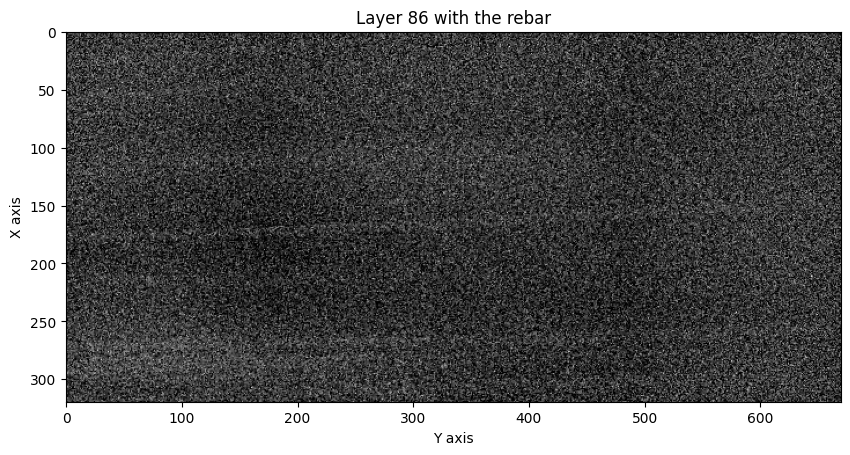

In [3]:
layer = data[:,:, 86]

plt.figure(figsize=(10, 20))
plt.imshow(layer, cmap='gray')
plt.title('Layer 86 with the rebar')
plt.ylabel('X axis')
plt.xlabel('Y axis')


plt.show()

Look at the layers

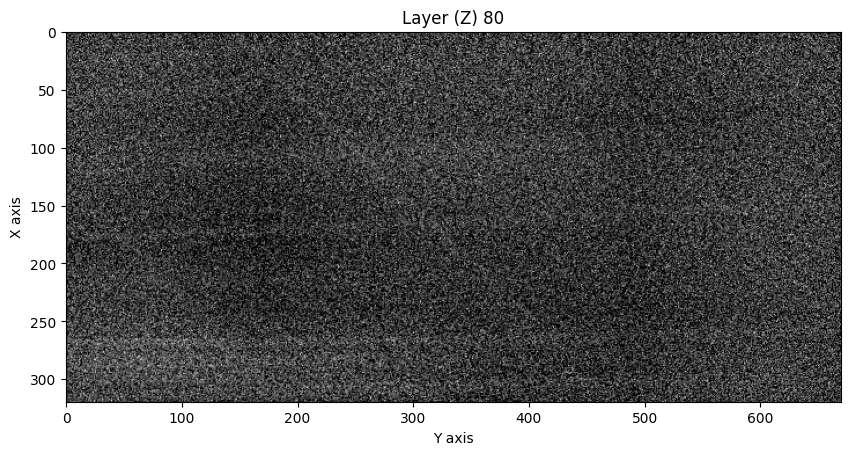

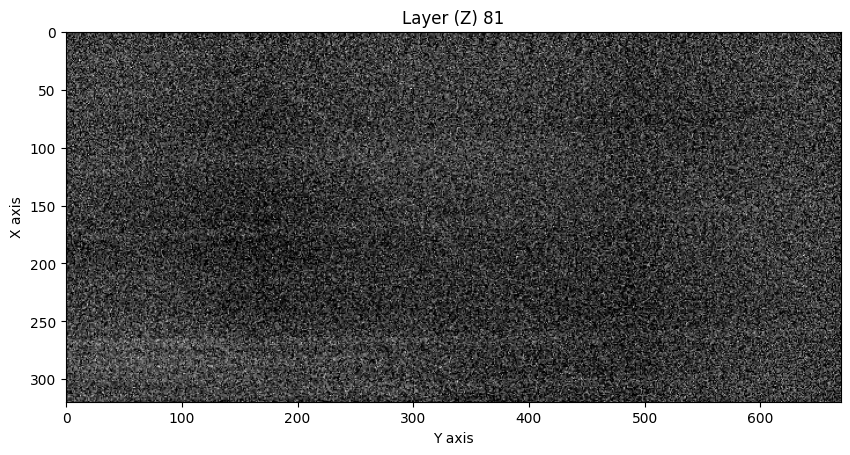

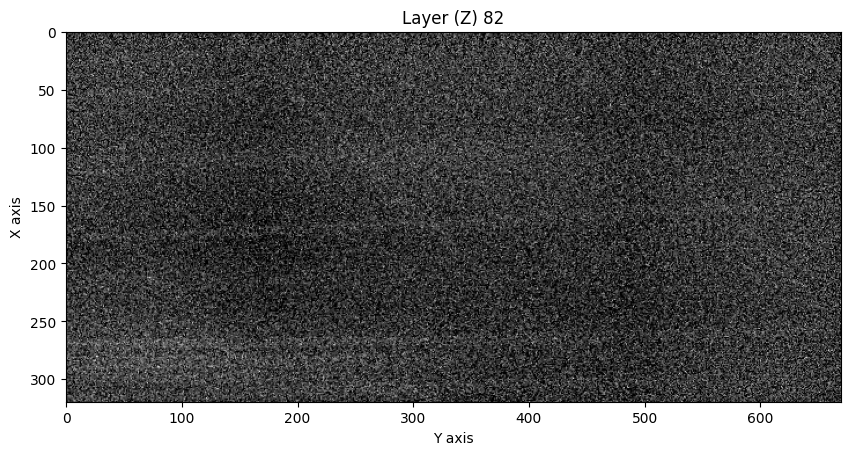

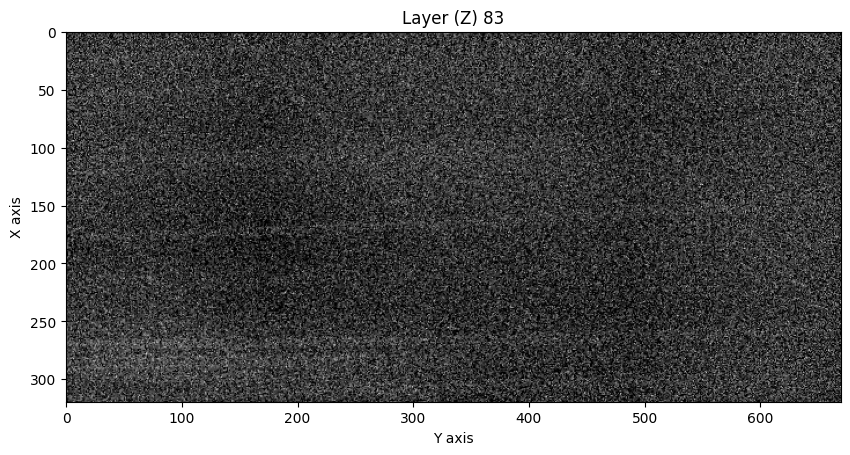

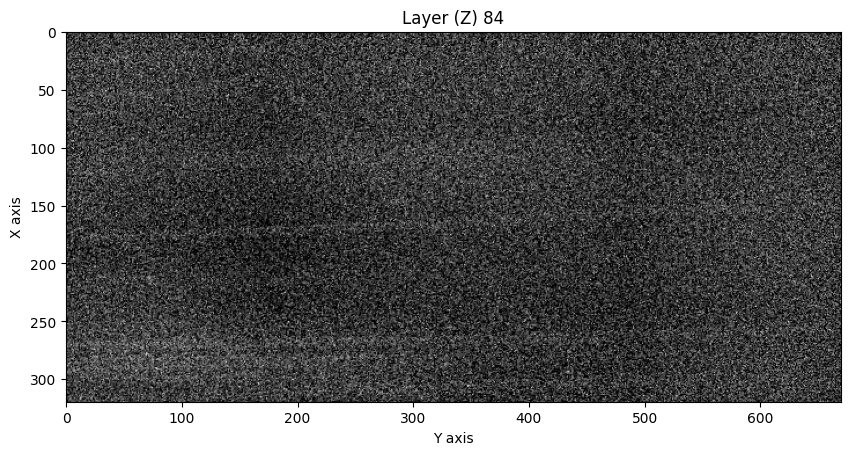

...

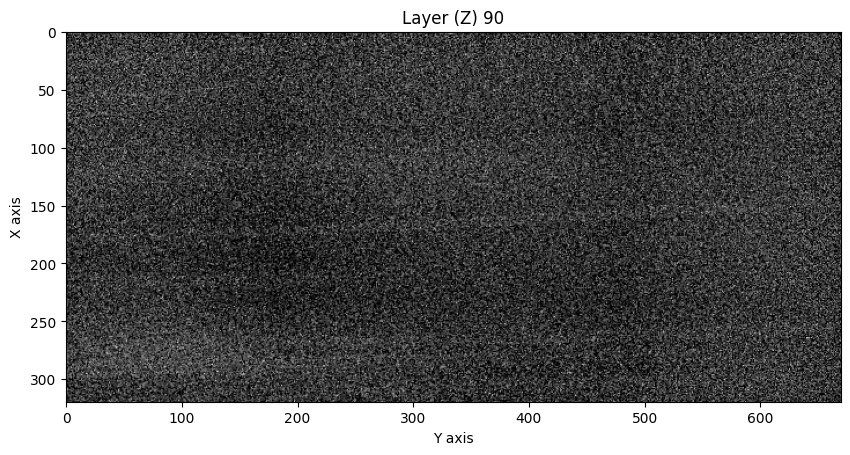

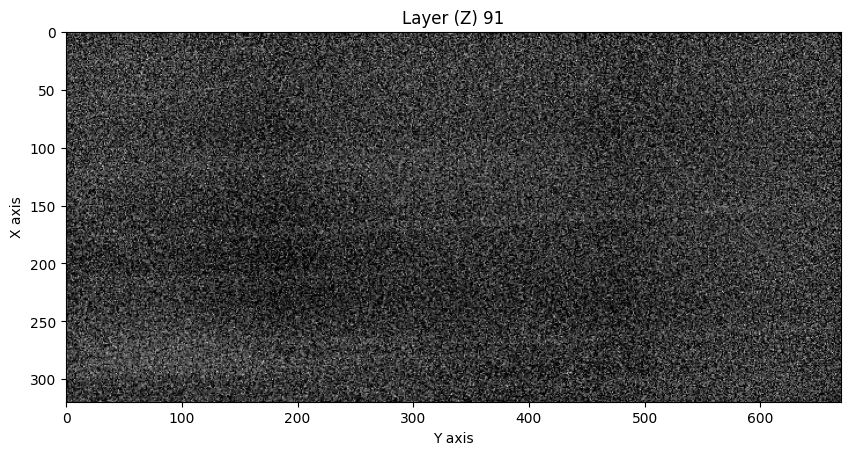

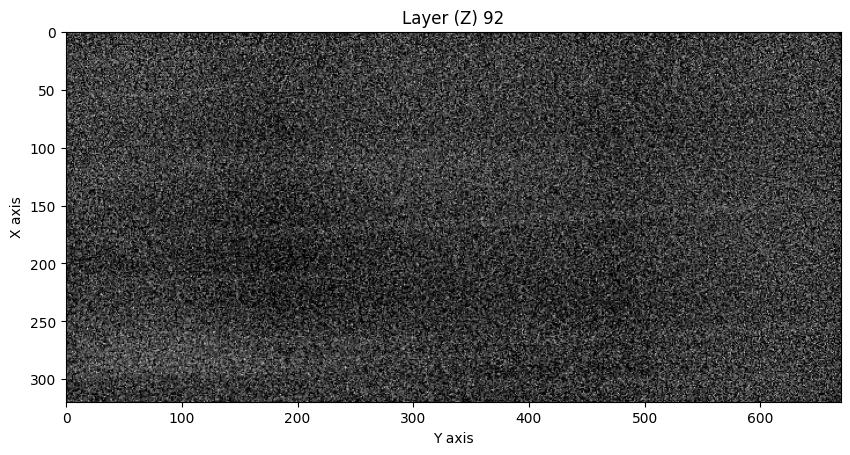

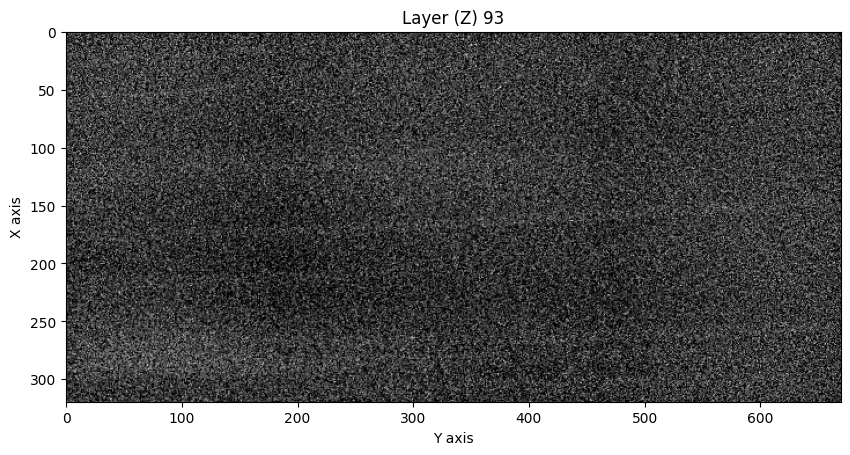

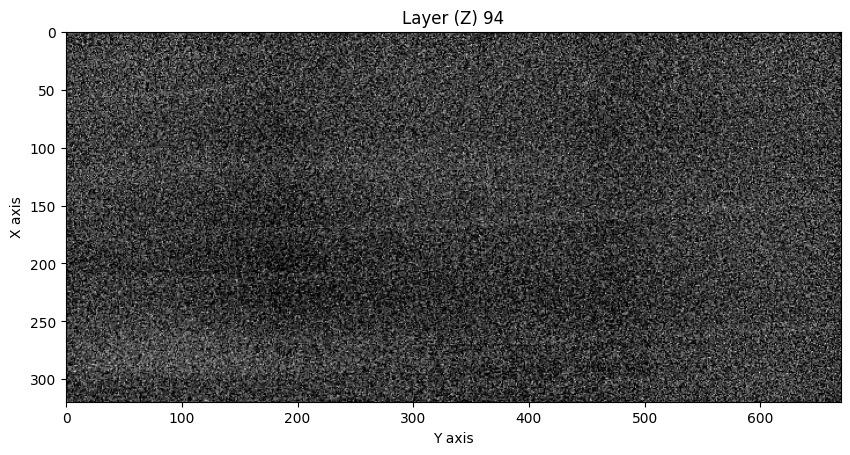

In [4]:
for layer in range(80, 95):
    plt.figure(figsize=(10, 20))
    plt.imshow(data[:,:, layer], cmap='gray')
    plt.title(f"Layer (Z) {layer}")
    plt.ylabel('X axis')
    plt.xlabel('Y axis')
    plt.show()

The rebar is offset relative to all coordinate axes. Therefore, as the Z layer increases, the projection length on the XY plane changes

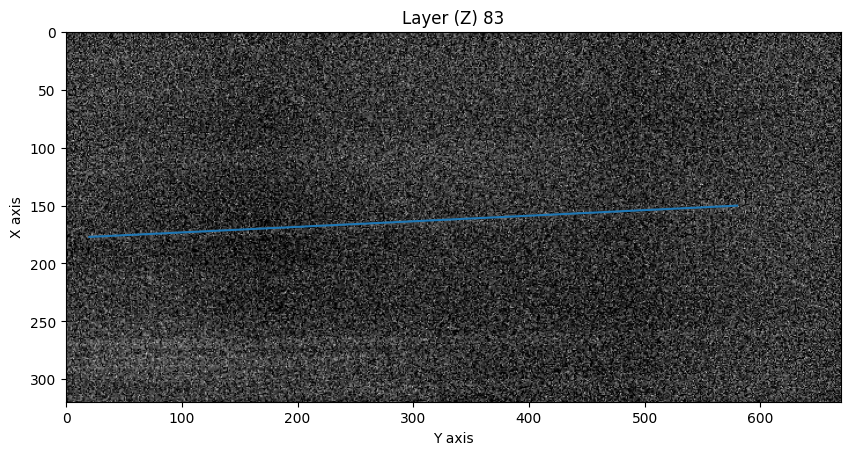

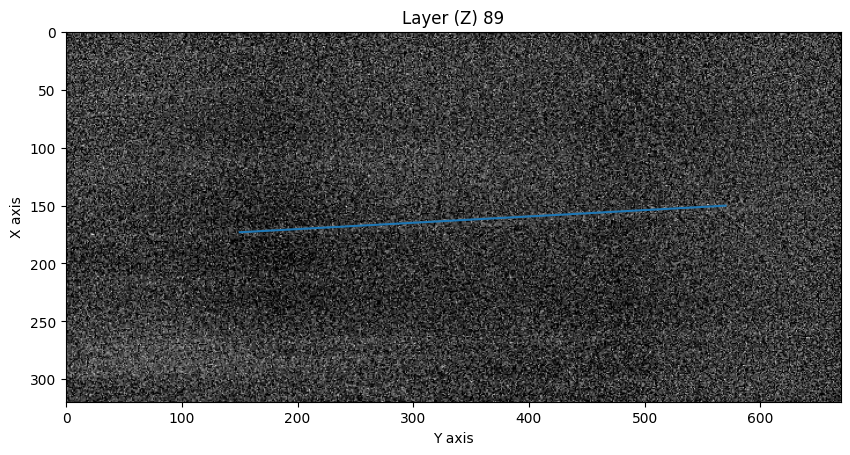

In [5]:
plt.figure(figsize=(10, 20))
plt.imshow(data[:,:, 83], cmap='gray')
plt.plot([20, 580], [177, 150])
plt.title('Layer (Z) 83')
plt.ylabel('X axis')
plt.xlabel('Y axis')
plt.show()

plt.figure(figsize=(10, 20))
plt.imshow(data[:,:, 89], cmap='gray')
plt.plot([150, 570], [173, 150])
plt.title('Layer (Z) 89')
plt.ylabel('X axis')
plt.xlabel('Y axis')
plt.show()

# Solution

## Approach 

My goal is to find discontinuous or gaps in the rebar. Based on the provided data, I will build a simple model - I will use statistical approach and calculate statistics near the rebar.

At the areas of rebar discontinuous the statistics will be different compare to normal areas. A sign of a defect is a statistically significant deviation of statistics in some area relative to the sample of statistics along the entire length of the rebar.

The idea is to imagine the rebar as an ideal model - a cylinder with a straight axis and a given diameter (or radius). The statistics within the volume occupied by this diameter should be uniform (typical of the metal); if there is a strong local difference (statistically significant), it can be considered a discontinuity.

The data contains unevenly distributed noise. There are highly noisy areas. To combat the noise, I will calculate statistics around the rebar and take them into account when analyzing the internal state of the rebar.

To achieve the goal I have to complete these tasks: 
- determine the model of a cylinder in the volume;
- calculate statistics in and around the volume;
- analyze these statistics;
- find outlers and determine the p-value.

Limitations:
- the approach represents the rebar as an ideal cylinder, which is a strong assumption since it does not take into account the deformations of the rebar (more accurate masks can be constructed that take deformations into account)
- the orientation of the cylinder and its parameters are determined by a person, which is labor-intensive and very inaccurate
- susceptible to noise in the data

Advantages:
- simple and fast
- interpretable model
- nice baseline model - may be improved

## Determine the model of a cylinder in the volume

The cylinder will be defined using a radius, an axis direction vector, and a point on the axis.

The radius is defined as the average cross-section size (in voxels). The axis vector and point are determined using PCA method for points on the axis

In [6]:
def projection_plots(x, y, z, w=10, h=(200, 150), data=data):
    """
    Build two slides in XZ and XY projections
    x, y, z - alleged coordinates of the cylinder axis
    w - sizes of the square
    h - X limitations
    """

    fig, ax = plt.subplots(1, 2, figsize=(5, 6))
    ax[0].imshow(data[:, y, :], cmap='gray', aspect='equal')
    rect = Rectangle(
        (z - w/2, x-w/2), 
        w, w,     
        edgecolor='red',
        facecolor='none'
    )
    ax[0].set_xlim(70,100)
    ax[0].set_ylim(h)
    ax[0].add_patch(rect)
    ax[0].set_title(f'ZX projection, Y={y}')
    ax[0].set_xlabel('Z axis')
    ax[0].set_ylabel('X axis')
    
    ax[1].imshow(data[:, :, z], cmap='gray', aspect='equal')
    ax[1].set_xlim(y-15,y+15)
    ax[1].set_ylim(h)

    rect = Rectangle(
        (y-2, x-w/2), 
        4, w,     
        edgecolor='red',
        facecolor='none'
    )
    ax[1].add_patch(rect)
    ax[1].set_title(f'XY projection, Z={z}')
    ax[1].set_xlabel('Y axis')
    ax[1].set_ylabel('X axis')
    plt.tight_layout()
    plt.show()

To refine the axis centers, I will find clusters of voxels with high intensity

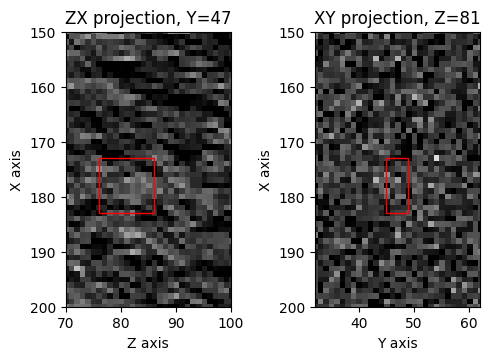

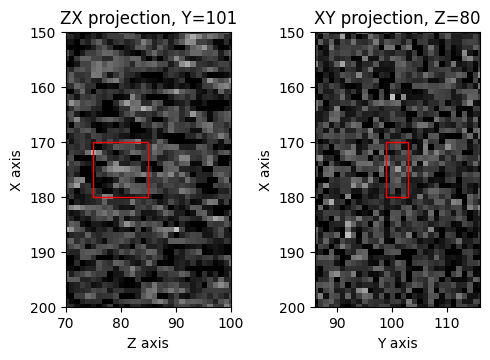

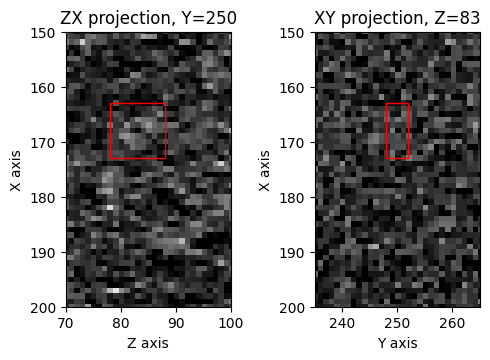

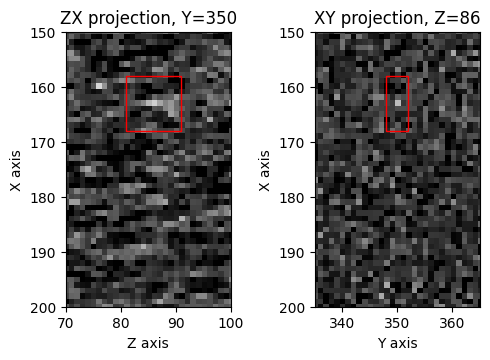

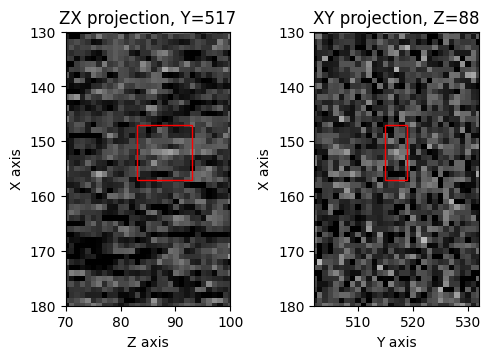

In [7]:
projection_plots(178, 47, 81)
projection_plots(175, 101, 80)
projection_plots(168, 250, 83)
projection_plots(163, 350, 86)
projection_plots(152, 517, 88, h=(180, 130))

Thus, the points on the rebar axis were very roughly determined

The radius was taken as 4 voxels, meaning the diameter with a voxel size of 3 mm would be 24 mm, which is quite typical

In [8]:
R = 4

points = np.array([
    [178, 47, 81],
    [175, 101, 80], 
    [168, 250, 83], 
    [163, 350, 86],
    [152, 517, 88]
]) # X, Y, Z

In [9]:
pca = PCA(n_components=1)
pca.fit(points)

point_on_line = pca.mean_
axis_direction = pca.components_[0]

print("Point_on_line:", point_on_line) # X, Y, Z
print("Direction (dx, dy, dz):", axis_direction) # X, Y, Z

def distance_point_to_line(point, point_on_line, axis_direction):
    v = point - point_on_line
    return np.linalg.norm(v - np.dot(v, axis_direction) * axis_direction)

RMSE = np.sqrt(np.array([
        distance_point_to_line(point, point_on_line, axis_direction)
        for point in points
    ])**2).mean()

print(f'RMSE of approximation: {RMSE:.3f} voxels')

Point_on_line: [167.2 253.   83.6]
Direction (dx, dy, dz): [-0.05406368  0.99839089  0.01710995]
RMSE of approximation: 1.023 voxels


Thus, I got the basic parameters of the cylinder - axis, radius and point on the axis

## Calculate statistics in and around the volume

Now I'll iterate through the layers along the rebar's axis, calculate the statistics and save them in pd.DataFrame

Statistics:
- mean
- std
- median
- p5, p95 - percentiles

volumes:
- window=1 - statistics are calculated only in the layer
- window=3 - statistics are calculated in the volume with neighbor layers
- window=5 - statistics are calculated in the volume with 2 neighbor layers

Statistics types:
- in - statistics are calculated in the volume of rebar
- noise - statistics are calculated in the noise measurement area, next to the rebar

In [10]:
def orthonormal_basis(u):
    """Returns v, w ⟂ u"""
    u = u / np.linalg.norm(u)
    # random vector not parallel to u
    a = np.array([1,0,0]) if abs(u[0]) < 0.9 else np.array([0,1,0])
    v = np.cross(u, a)
    v /= np.linalg.norm(v)
    w = np.cross(u, v)
    return u, v, w


def precompute_circle(R):
    """2D integer offsets within a circle of radius R"""
    offsets = []
    r2 = R*R
    for dx in range(-R, R+1):
        for dy in range(-R, R+1):
            if dx*dx + dy*dy <= r2:
                offsets.append((dx, dy))
    return np.array(offsets, dtype=np.float32)

In [11]:
def p5(x):
    return np.percentile(x, 5)

def p95(x):
    return np.percentile(x, 95)

def axis_iteration(
    volume, 
    p0, 
    axis_direction, 
    R, 
    funcs=[np.mean, np.std, np.median, p5, p95], 
    window=5, 
    thickness=3, 
    noise_indent=1, 
    xlim=None, 
    ylim=None, 
    zlim=None
):
    """
    Iterates along the cylinder axis
    
    volume
    p0: point on axis
    axis_direction: direction vector
    R: radius in voxels
    """
    nx, ny, nz = volume.shape
    if not xlim:
        xlim = (0, nx)
    if not ylim:
        ylim = (0, ny)
    if not zlim:
        zlim = (0, nz)
    
    max_len = int(np.linalg.norm(volume.shape))
    u, v, w = orthonormal_basis(axis_direction)

    # step along the axis
    step = u / np.max(np.abs(u))

    # circle template
    circle = precompute_circle(R)
    dv = circle[:,0][:,None]
    dw = circle[:,1][:,None]
    circle_proj = dv * v + dw * w

    # noise measurement area template
    ext_b = precompute_circle(R+noise_indent+thickness)
    int_b = precompute_circle(R+noise_indent)
    noise_msrt = np.setdiff1d(
        ext_b.view(np.dtype((np.void, ext_b.dtype.itemsize * 2))), 
        int_b.view(np.dtype((np.void, int_b.dtype.itemsize * 2)))
    ).view(np.float32).reshape(-1, 2)
    dv = noise_msrt[:,0][:,None]
    dw = noise_msrt[:,1][:,None]
    noise_msrt_proj = dv * v + dw * w
    
    stats = []
    
    for k in range(-max_len, max_len):
    
        centers = []
        values_in = np.array([])
        values_noise = np.array([])
    
        for s in range(-window//2+1, window//2+1):
            
            # center point of the circle
            p = np.round(p0 + (k + s) * step).astype(int)
            
            # skipping all points outside the volume
            if (xlim[0] <= p[0] < xlim[1] and ylim[0] <= p[1] < ylim[1] and zlim[0] <= p[2] < zlim[1]):
                centers.append(p)
        if not centers:
            continue
    
        for p in centers:
            # coordinates of the points of a circle  
            idx_in = np.round(p + circle_proj).astype(np.int32) # shape (N,3)
            idx_noise = np.round(p + noise_msrt_proj).astype(np.int32) # shape (N,3)
    
            # adjustment at the boundaries
            mask_in = (
                (idx_in[:,0] >= 0) & (idx_in[:,0] < nx) &
                (idx_in[:,1] >= 0) & (idx_in[:,1] < ny) &
                (idx_in[:,2] >= 0) & (idx_in[:,2] < nz)
            )
            idx_in = idx_in[mask_in]
            if idx_in.shape[0] == 0:
                continue

            mask_noise = (
                (idx_noise[:,0] >= 0) & (idx_noise[:,0] < nx) &
                (idx_noise[:,1] >= 0) & (idx_noise[:,1] < ny) &
                (idx_noise[:,2] >= 0) & (idx_noise[:,2] < nz)
            )
            idx_noise = idx_noise[mask_noise]
        
            values_in = np.append(values_in, volume[idx_in[:,0], idx_in[:,1], idx_in[:,2]])
            values_noise = np.append(values_noise, volume[idx_noise[:,0], idx_noise[:,1], idx_noise[:,2]])

        stats.append((*p, *[f(values_in) for f in funcs], *[f(values_noise) for f in funcs]))

    return pd.DataFrame(stats, columns=['x', 'y', 'z', *[f"in_{f.__name__}" for f in funcs], *[f"noise_{f.__name__}" for f in funcs]]).reset_index(names='k')

I'll repeat the operation with different window values.

In [12]:
df_1 = axis_iteration(volume=data, p0=point_on_line, axis_direction=axis_direction, R=4, window=1, thickness=3, noise_indent=1, ylim=(45, 580))

df_3 = axis_iteration(volume=data, p0=point_on_line, axis_direction=axis_direction, R=4, window=3, thickness=3, noise_indent=1, ylim=(45, 580))

df_5 = axis_iteration(volume=data, p0=point_on_line, axis_direction=axis_direction, R=4, window=5, thickness=3, noise_indent=1, ylim=(45, 580))

Now that I have statistics for internal volume and noise, I can evaluate whether the orientation of the cylinder in the volume matches the rebar under observation

Visually, the distributions are quite similar.
- The mean and median in the cylinder is shifted to the right relative to the noise mean and median, as expected
- The standard deviation appears similar
- The 95th percentile in the cylinder is shifted to the right relative to the 95th percentile of the noise, as expected. 

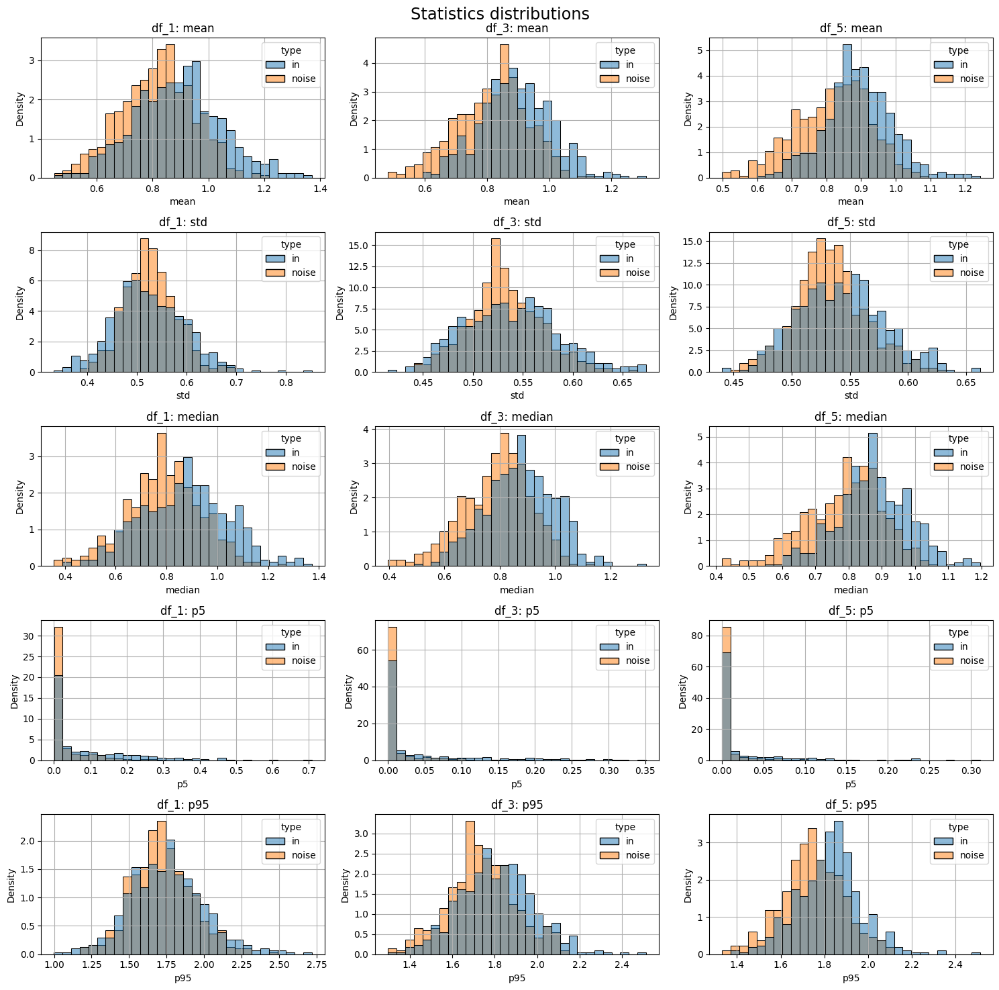

In [13]:
graphs = ['mean', 'std', 'median', 'p5', 'p95']
dfs = [df_1, df_3, df_5]
df_names = ['df_1', 'df_3', 'df_5']

n_rows = len(graphs)
n_cols = len(dfs)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
alpha = 0.025

for i, graph in enumerate(graphs):
    for j, df in enumerate(dfs):
        
        ax = axes[i, j]

        col_in = f"in_{graph}"
        col_noise = f"noise_{graph}"

        df_long = pd.DataFrame({
            graph: pd.concat([df[col_in], df[col_noise]]),
            'type': (['in'] * len(df)) + (['noise'] * len(df))
        })

        sns.histplot(
            data=df_long,
            x=graph,
            hue='type',
            bins=30,
            stat='density',
            common_norm=False,
            alpha=0.5,
            ax=ax,
            legend=True
        )
        ax.set_title(f"{df_names[j]}: {graph}")
        ax.grid(True)
        
plt.suptitle('Statistics distributions', size='xx-large')
plt.tight_layout()
plt.show()

## Checking the correct orientation of the cylinder

To verify that the cylinder matches the rebar under observation, I'll conduct a statistical test

Null hypothesis: The average signal value inside the cylinder is no greater than the noise - the cylinder is randomly oriented

Alternative hypothesis: The average signal value is greater than the average noise - the cylinder matches the rebar.

Check whether the data follow a normal distribution

The Shapiro tests show p-values significantly below 0.05 — it doesn't follow the normal distribution

The QQ-plots show minor deviations in the tails

window=3: Shapiro p-value for distribution within the rebar 0.29484
window=5: Shapiro p-value for distribution within the rebar 0.00528

window=3: Shapiro p-value for noise distribution 0.00699
window=5: Shapiro p-value for noise distribution 0.00118


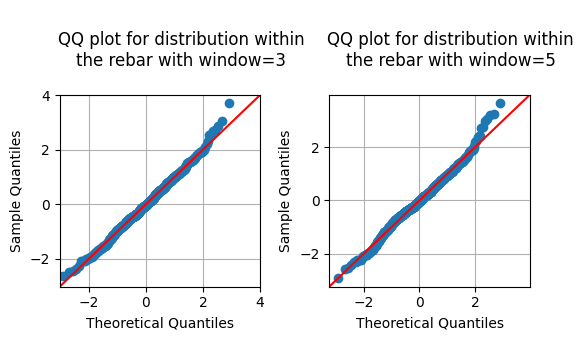

In [14]:
print(f'window=3: Shapiro p-value for distribution within the rebar {shapiro(df_3.in_mean).pvalue:.5f}')
print(f'window=5: Shapiro p-value for distribution within the rebar {shapiro(df_5.in_mean).pvalue:.5f}')

print()

print(f'window=3: Shapiro p-value for noise distribution {shapiro(df_3.noise_mean).pvalue:.5f}')
print(f'window=5: Shapiro p-value for noise distribution {shapiro(df_5.noise_mean).pvalue:.5f}')


dfs = [df_3, df_5]
windows = [3, 5]

fig, axes = plt.subplots(1, 2, figsize=(5.5, 3.5))

for ax, df, window in zip(axes, dfs, windows):
    values = df['in_mean']
    values = (values - np.mean(values)) / np.std(values) 
    sm.qqplot(values, line='45', ax=ax)
    ax.set_title(
        f"""
        QQ plot for distribution within
        the rebar with window={window}
        """
    )
    ax.grid(True)

plt.tight_layout()
plt.show()

Since the values are correlated, the samples are not independent - so I will use Wilcoxon test for paired samples. 

In [15]:
stat, p = wilcoxon(
    df_3.in_mean, 
    df_3.noise_mean, 
    alternative='greater'
)
print(f'window=3: Wilcoxon p-value: {p}')

stat, p = wilcoxon(
    df_5.in_mean, 
    df_5.noise_mean, 
    alternative='greater'
)
print(f'window=5: Wilcoxon p-value: {p}')

print()

stat, p = ttest_rel(
    df_3.in_mean, 
    df_3.noise_mean, 
    alternative='greater'
)
print(f'window=3: ttest p-value: {p}')

stat, p = ttest_rel(
    df_5.in_mean, 
    df_5.noise_mean, 
    alternative='greater'
)
print(f'window=5: ttest p-value: {p}')

window=3: Wilcoxon p-value: 5.673229395015098e-41
window=5: Wilcoxon p-value: 2.176893720767335e-55

window=3: ttest p-value: 1.6686178233574078e-46
window=5: ttest p-value: 3.402788393303541e-65


p-value < 0.05 -> the null hypothesis may be rejected - the data in the cylinder differs from the data in the noise measurement zone.

The cylinder is not oriented randomly

## Denoising

The problem is non-uniform noise, which varies along the Y-axis and affects the signal strength in dark (gray) and light (yellow) areas

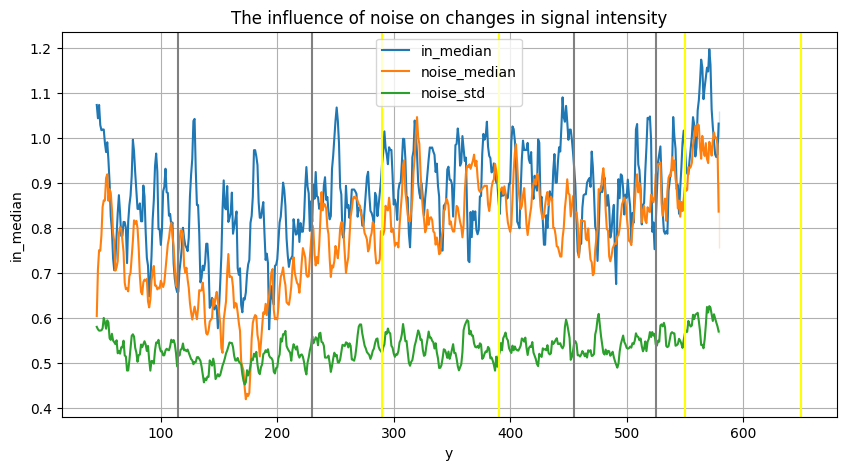

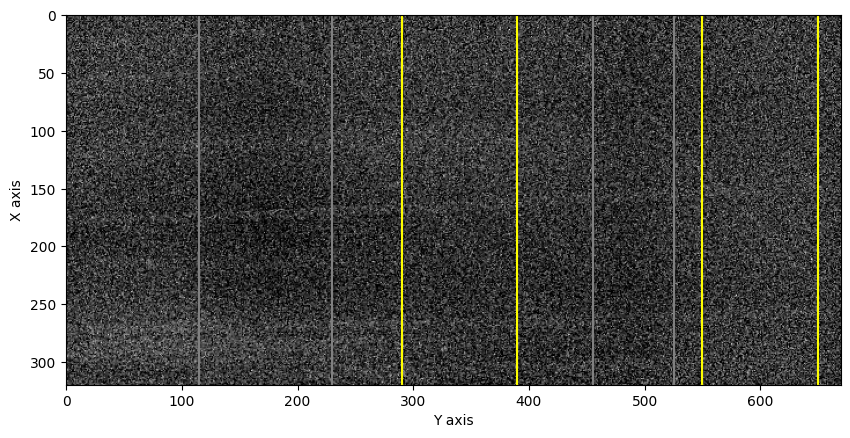

In [16]:
plt.figure(figsize=(10, 5))

sns.lineplot(data=df_5, x='y', y='in_median', label='in_median')
sns.lineplot(data=df_5, x='y', y='noise_median', label='noise_median')
sns.lineplot(data=df_5, x='y', y='noise_std', label='noise_std')
plt.legend()
plt.grid(True)
plt.axvline(115, c='gray')
plt.axvline(230, c='gray')

plt.axvline(290, c='yellow')
plt.axvline(390, c='yellow')


plt.axvline(455, c='gray')
plt.axvline(525, c='gray')

plt.axvline(550, c='yellow')
plt.axvline(650, c='yellow')

plt.title('The influence of noise on changes in signal intensity')

plt.show()


plt.figure(figsize=(10, 10))
plt.imshow(data[:, :, 86], cmap='gray')
plt.xlabel('Y axis')
plt.ylabel('X axis')

plt.axvline(115, c='gray')
plt.axvline(230, c='gray')

plt.axvline(290, c='yellow')
plt.axvline(390, c='yellow')


plt.axvline(455, c='gray')
plt.axvline(525, c='gray')

plt.axvline(550, c='yellow')
plt.axvline(650, c='yellow')

plt.show()

To eliminate the influence of noise, I will apply and compare several SNR approaches:
- snr_mean - by how many standard deviations of noise does the mean value in the rebar differ from the noise mean?
- snr_median - robust version of snr_mean
- snr_p95 - observe the upper tail of the distribution to answer the question: Is there any metal in the area at all?

In [17]:
def calc_snrs(df):
    df['snr_mean'] = (df['in_mean'] - df['noise_mean']) / (df['noise_std'] + 1e-16)
    df['snr_median'] = (df['in_median'] - df['noise_median']) / (df['noise_p95'] - df['noise_p5'] + 1e-16)
    df['snr_p95'] = (df['in_p95'] - df['noise_p95']) / (df['noise_p95'] - df['noise_p5'] + 1e-16)
    return df

In [18]:
df_1 = calc_snrs(df_1)
df_3 = calc_snrs(df_3)
df_5 = calc_snrs(df_5)

Noisy zones no longer affect the SNR distribution.

SNR calculated using mean changes more than other SNRs.

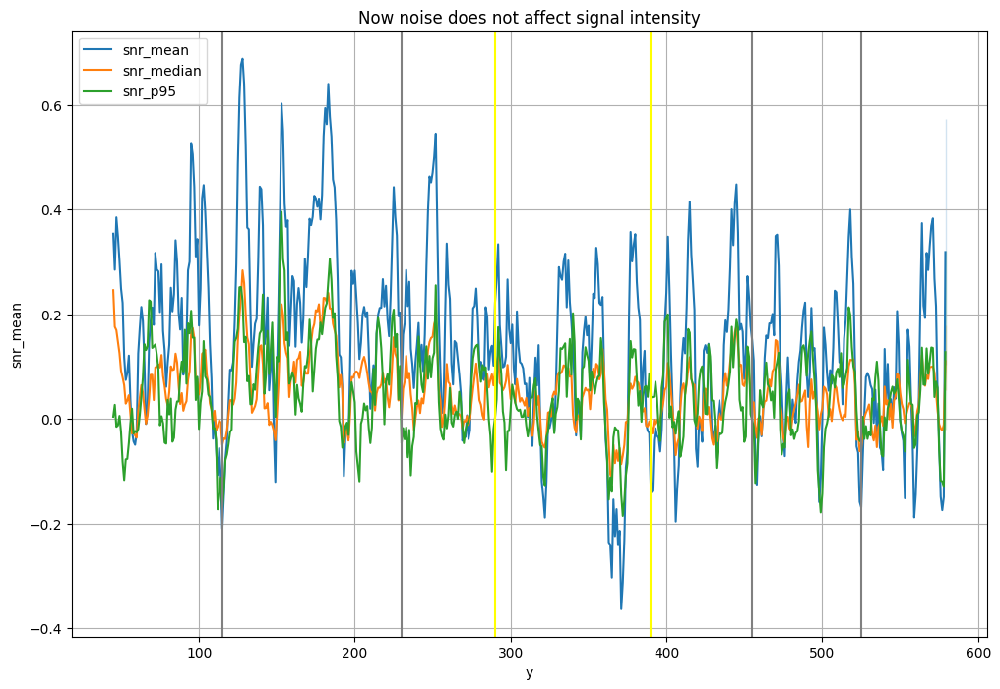

In [19]:
plt.figure(figsize=(12, 8))

sns.lineplot(data=df_5, x='y', y='snr_mean', label='snr_mean')
sns.lineplot(data=df_5, x='y', y='snr_median', label='snr_median')
sns.lineplot(data=df_5, x='y', y='snr_p95', label='snr_p95')
plt.legend()
plt.grid(True)
plt.axvline(115, c='gray')
plt.axvline(230, c='gray')

plt.axvline(290, c='yellow')
plt.axvline(390, c='yellow')


plt.axvline(455, c='gray')
plt.axvline(525, c='gray')

plt.title('Now noise does not affect signal intensity')
plt.show()

It is possible to estimate the correlation of SNR metrics

The results are well correlated

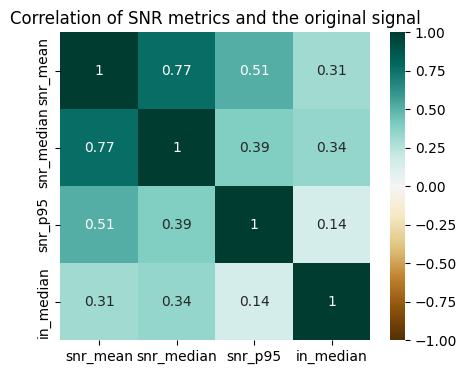

In [20]:
df_corr = df_3[['snr_mean', 'snr_median', 'snr_p95', 'in_median']].corr(method = 'kendall')

fig = plt.figure(figsize=(5, 4))

sns.heatmap(df_corr,
			xticklabels = df_corr.columns,
			yticklabels = df_corr.columns,
			annot = True,
			cmap = 'BrBG', vmin = -1, vmax = 1)

plt.title('Correlation of SNR metrics and the original signal')
plt.show()

## SNR distributions

As I mentioned earlier, in areas of defects, the signal intensity will be lower than in healthy metal. To compare approaches, I'll look at the location of 0.025 low-intensity points.

When collecting statistics with a window width of 1, the scatter is very large. There are no areas with a high point density.

The larger the window width, the greater the density of low-intensity dots, but using large windows can potentially lead to missing defects due to too much smoothing.

Without noise reduction, low-intensity points are grouped in a noisy region where all voxels have lower-than-average intensities. Therefore, noise reduction is necessary.

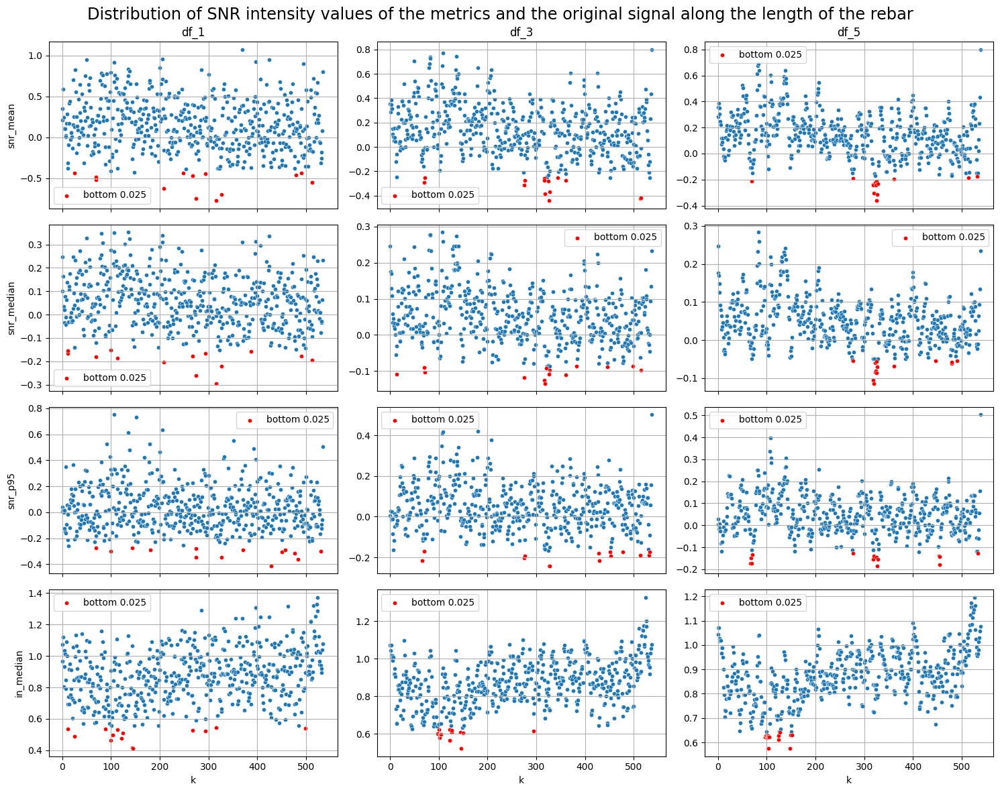

In [21]:
graphs = ['snr_mean', 'snr_median', 'snr_p95', 'in_median']
dfs = [df_1, df_3, df_5]
df_names = ['df_1', 'df_3', 'df_5']

n_rows = len(graphs)
n_cols = len(dfs)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 12), sharex=True)
alpha = 0.025

for i, graph in enumerate(graphs):
    for j, df in enumerate(dfs):
        
        ax = axes[i, j]
        threshold = df[graph].quantile(alpha)

        sns.scatterplot(
            data=df[df[graph] > threshold],
            x='k',
            y=graph,
            ax=ax,
            s=20
        )

        sns.scatterplot(
            data=df[df[graph] <= threshold],
            x='k',
            y=graph,
            ax=ax,
            color='red',
            s=20,
            label=f'bottom {alpha}'
        )

        ax.grid(True)
        
        if i == 0:
            ax.set_title(df_names[j])

        if j == 0:
            ax.set_ylabel(graph)
        else:
            ax.set_ylabel("")

plt.suptitle('Distribution of SNR intensity values of the metrics and the original signal along the length of the rebar', size='xx-large')

plt.tight_layout()
plt.show()

Let's look at the distributions.

The shape is bell-shaped, but also has heavy tails, which affects the Shapiro score. This may also be due to the small sample size.

For most Shapiro distributions, the p-value is < 0.05, meaning the normal distribution law is not satisfied.

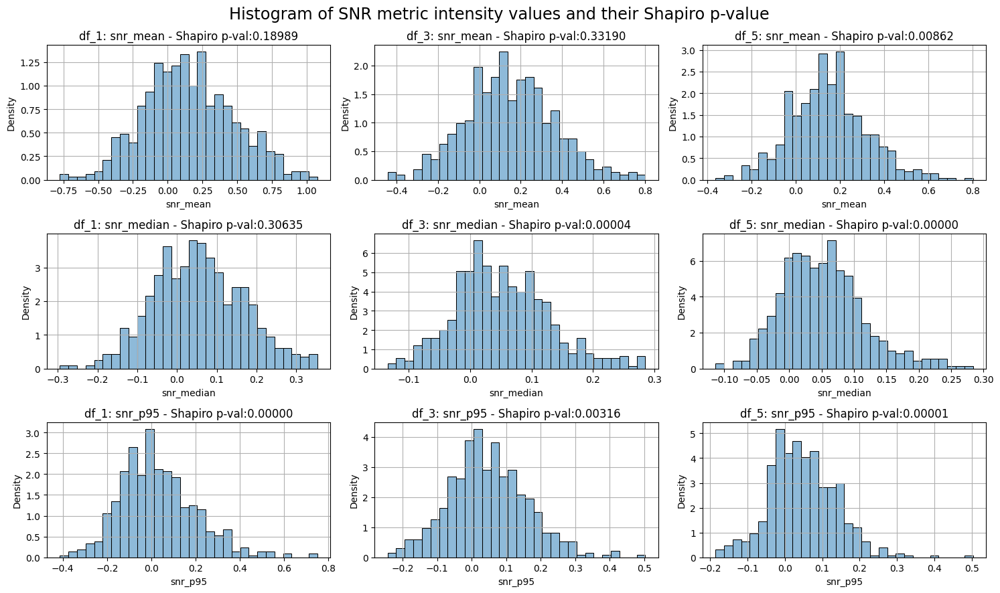

In [22]:
graphs = ['snr_mean', 'snr_median', 'snr_p95']
dfs = [df_1, df_3, df_5]
df_names = ['df_1', 'df_3', 'df_5']

n_rows = len(graphs)
n_cols = len(dfs)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 9))

for i, graph in enumerate(graphs):
    for j, df in enumerate(dfs):
        
        ax = axes[i, j]

        sns.histplot(
            data=df,
            x=graph,
            bins=30,
            stat='density',
            common_norm=False,
            alpha=0.5,
            ax=ax,
            legend=True
        )
        
        ax.set_title(f"{df_names[j]}: {graph} - Shapiro p-val:{shapiro(df[graph]).pvalue:.5f}")
        ax.grid(True)

plt.suptitle('Histogram of SNR metric intensity values and their Shapiro p-value', size='xx-large')

plt.tight_layout()
plt.show()

## Confidence estimation

The model must indicate not only the coordinates of potential defect locations, but also its confidence that this is not just a fluctuation.

As confidence I wil use cdf and logistic function:
- 'cdf': Fit Student-t distribution to the core signal and compute tail probabilities.
- 'logistic': Robust logistic anomaly score using MAD-normalized SNR.

Since the location of the defects is unknown, I will not be able to calibrate the logistic function, but I will leave 2 parameters: sigma_threshold, which is responsible for the critical deviation after which the object can be considered defective, and steepness, which is responsible for the slope of the curve.

In [23]:
snrs = ['snr_mean', 'snr_median', 'snr_p95']

sigma_threshold = -3
steepness = 5

for df in [df_1, df_3, df_5]:
        
    for snr in snrs:
        
        med = df[snr].median()
        sigma = 1.4826 * np.abs((df[snr] - med)).median()
        
        # cdf
        core = df[(df[snr] > med - 3*sigma) & (df[snr] < med + 3*sigma)][snr]
        df[f'cdf_{snr}'] = t.cdf(df[snr], *t.fit(core))

        # logistic
        z_s = (df[snr] - med) / sigma
        df[f'logistic_{snr}'] = 1 / (1 + np.exp(steepness*(z_s - sigma_threshold)))
        df.loc[df[z_s > 0].index, f'logistic_{snr}'] = 0

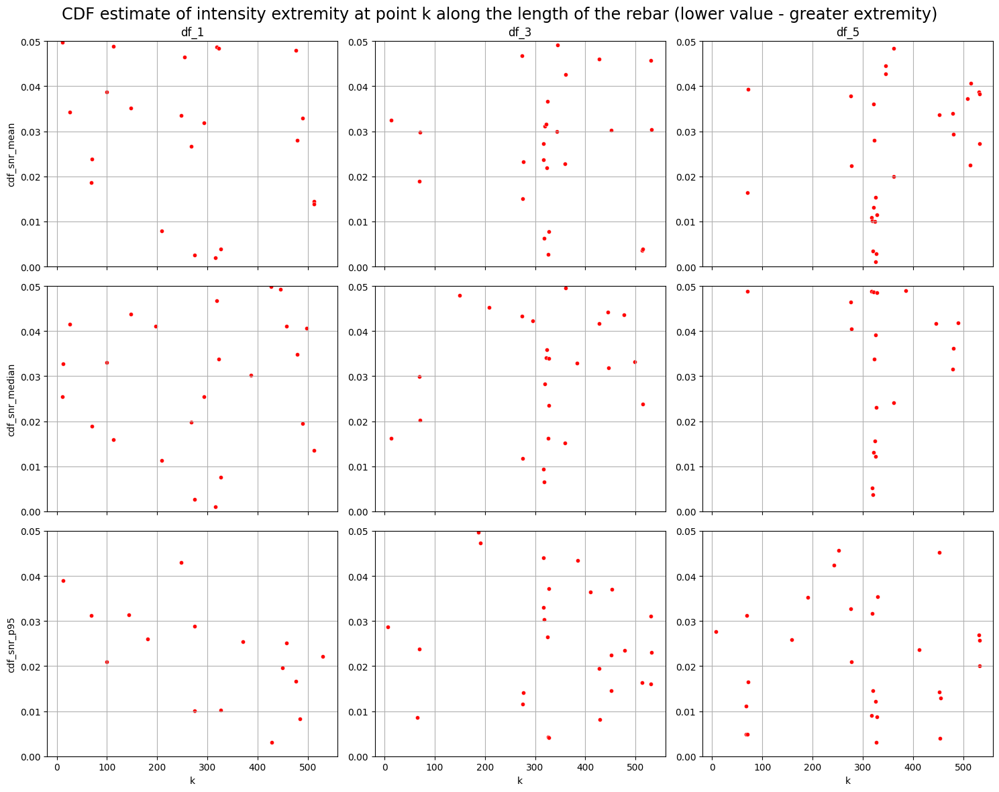

In [24]:
graphs = ['cdf_snr_mean', 'cdf_snr_median', 'cdf_snr_p95']
dfs = [df_1, df_3, df_5]
df_names = ['df_1', 'df_3', 'df_5']

n_rows = len(graphs)
n_cols = len(dfs)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 12), sharex=True)
threshold = 0.05

for i, graph in enumerate(graphs):
    for j, df in enumerate(dfs):
        
        ax = axes[i, j]

        sns.scatterplot(
            data=df[df[graph] <= threshold],
            x='k',
            y=graph,
            ax=ax,
            s=20,
            color='red'
        )

        ax.grid(True)

        ax.set_ylim(0, threshold)
        
        if i == 0:
            ax.set_title(df_names[j])

        if j == 0:
            ax.set_ylabel(graph)
        else:
            ax.set_ylabel("")

plt.suptitle('CDF estimate of intensity extremity at point k along the length of the rebar (lower value - greater extremity)', size='xx-large')

plt.tight_layout()
plt.show()

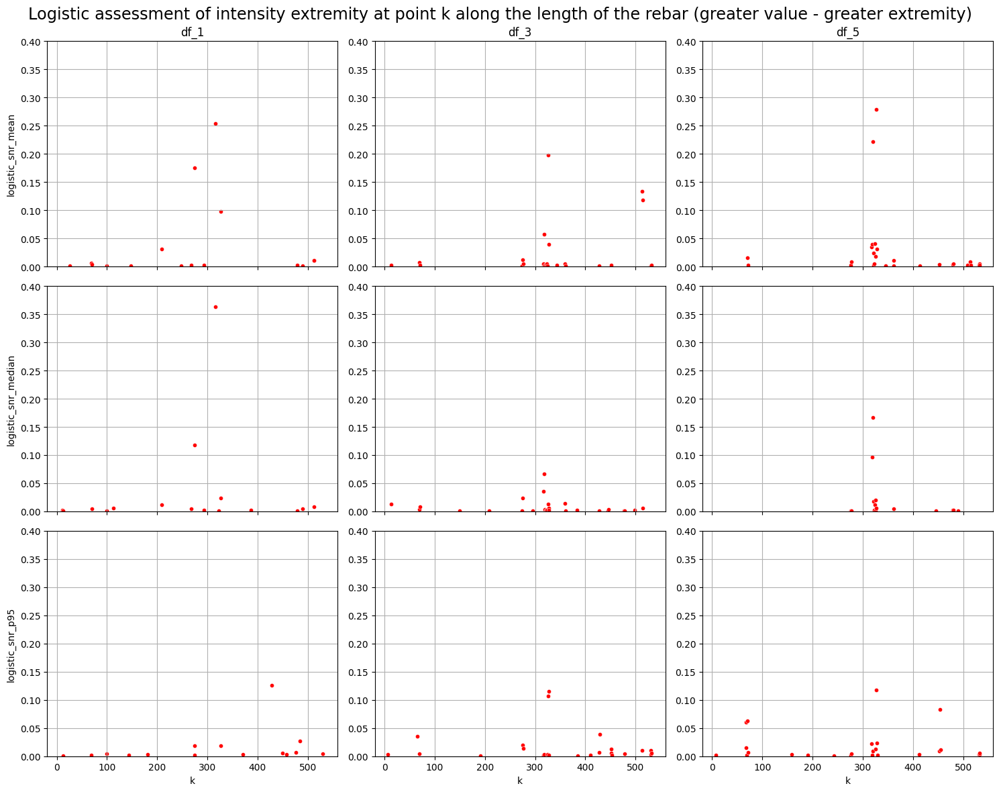

In [25]:
graphs = ['logistic_snr_mean', 'logistic_snr_median', 'logistic_snr_p95']
dfs = [df_1, df_3, df_5]
df_names = ['df_1', 'df_3', 'df_5']

n_rows = len(graphs)
n_cols = len(dfs)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 12), sharex=True)
threshold = 0.001

for i, graph in enumerate(graphs):
    for j, df in enumerate(dfs):
        
        ax = axes[i, j]

        sns.scatterplot(
            data=df[df[graph] >= threshold],
            x='k',
            y=graph,
            ax=ax,
            s=20,
            color='red'
        )

        ax.grid(True)
        ax.set_ylim(0, 0.4)
        
        if i == 0:
            ax.set_title(df_names[j])

        if j == 0:
            ax.set_ylabel(graph)
        else:
            ax.set_ylabel("")
plt.suptitle('Logistic assessment of intensity extremity at point k along the length of the rebar (greater value - greater extremity)', size='xx-large')
plt.tight_layout()
plt.show()

# Conclusion

This notebook substantiated the logic behind constructing a model for detecting defects in the rebar of a reinforced concrete block.

A method for iterating along the rebar axis was proposed, calculating statistics within and around the studied volume of a cylinder of ideal rebar.

Noise suppression was performed to eliminate the noise component, which significantly impacts signal intensity.

Model confidence estimates were obtained as the degree of extremeness of such a value.

**The model code can be found in the model module.**

**Model application and stability assessment are located in the 'model_application' notebook.**